In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

## Capturar rosto

In [ ]:
classificador = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
classificadorOlho = cv2.CascadeClassifier("haarcascade_eye.xml") 
camera = cv2.VideoCapture(0) 
amostra = 1
numeroAmostras = 25 
id = input('Digite seu identificador: ') 
largura, altura = 200, 200 
print("Capturando as faces...")

while True:
    conectado, imagem = camera.read() # captura das imagens pela webcam
    imagemCinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY) 
    facesDetectadas = classificador.detectMultiScale(imagemCinza, scaleFactor=1.5, minSize=(100, 100)) 

    for (x, y, l, a) in facesDetectadas:
        cv2.rectangle(imagem, (x, y), (x + l, y + a), (0, 0, 255), 2)
        regiao = imagem[y:y + a, x:x + l] 
        regiaoCinzaOlho = cv2.cvtColor(regiao, cv2.COLOR_BGR2GRAY)
        olhosDetectados = classificadorOlho.detectMultiScale(regiaoCinzaOlho)
        for (ox, oy, ol, oa) in olhosDetectados:
            cv2.rectangle(regiao, (ox, oy), (ox + ol, oy + oa), (0, 255, 0), 2) 

        if cv2.waitKey(1) & 0xFF == ord('q'): 
            if np.average(imagemCinza) > 100:
                imagemFace = cv2.resize(imagemCinza[y:y + a, x:x + l], (largura, altura))
                cv2.imwrite("fotos/pessoa." + str(id) + "." + str(amostra) + ".jpg", imagemFace) 
                print("[foto " + str(amostra) + " capturada com sucesso]")
                amostra += 1

    cv2.imshow("Face", imagem)
    cv2.waitKey(1)
    if amostra >= numeroAmostras + 1:
        break

print("Faces capturadas com sucesso") 
camera.release()
cv2.destroyAllWindows()

## Treino da função de reconhecimento LBPH

In [ ]:
lbph = cv2.face.LBPHFaceRecognizer_create() 

def getImagemComId():
    caminhos = [os.path.join('fotos', f) for f in os.listdir('fotos') if f.endswith('.jpg') or f.endswith('.png')]
    faces = []
    ids = []
    for caminhoImagem in caminhos:
        imagemFace = cv2.cvtColor(cv2.imread(caminhoImagem), cv2.COLOR_BGR2GRAY) 
        id = int(os.path.split(caminhoImagem)[-1].split('.')[1]) 
        ids.append(id)
        faces.append(imagemFace)
    return np.array(ids), faces

ids, faces = getImagemComId()

lbph.train(faces, ids)
lbph.write('classificadorLBPH.yml') 

## Detecção de rostos

In [2]:
detectorFace = cv2.CascadeClassifier("haarcascade_frontalface_default.xml") 
reconhecedor = cv2.face.LBPHFaceRecognizer.create() 
reconhecedor.read('classificadorLBPH.yml') 
largura, altura = 2, 2
font = cv2.FONT_HERSHEY_COMPLEX_SMALL 
imagem3 = cv2.imread('teste_face/teste4.jpg')
imagemCinza = cv2.cvtColor(imagem3,cv2.COLOR_BGR2GRAY) 
facesDetectadas = detectorFace.detectMultiScale(imagemCinza, scaleFactor=1.5, minSize=(30, 30)) 

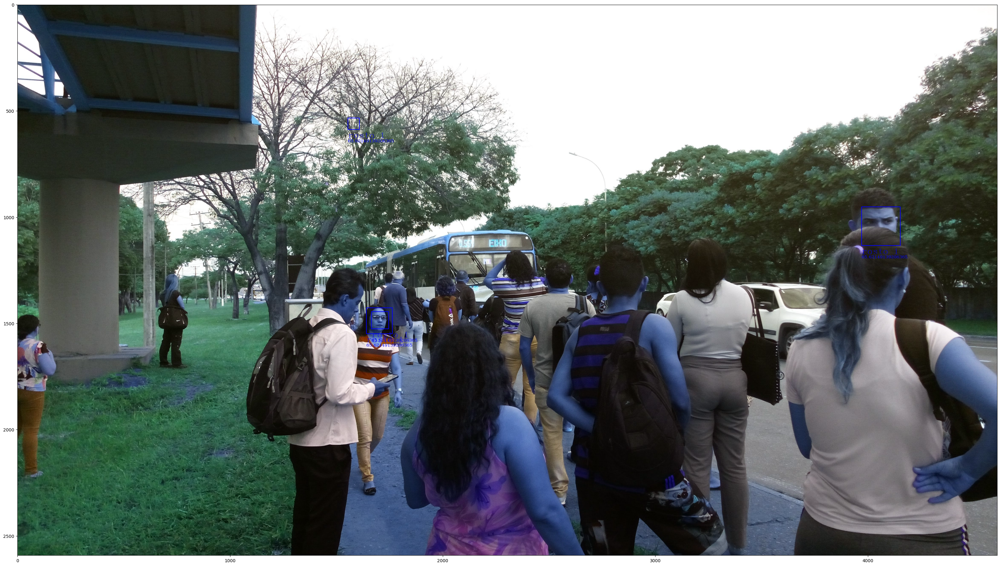

In [3]:
for (x, y, l, a) in facesDetectadas:
    cv2.rectangle(imagem3, (x, y), (x + l, y + a), (0, 0, 255), 2) 
    id, confianca = reconhecedor.predict(imagemCinza) 
    nome = ""
    if id == 1:
        nome = 'rosto 1' 
    elif id == 0:
        nome = 'rosto 2' 
    cv2.putText(imagem3, nome, (x, y + (a + 40)), font, 2, (0, 0, 255)) 
    cv2.putText(imagem3, str(confianca), (x, y + (a + 60)), font, 1, (0, 0, 255)) 

plt.figure(figsize=(40,40))
plt.imshow(imagem3)
plt.show()

## Com Modelo Yolo

In [4]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image
import cv2 ,random, numpy as np

In [5]:
model = YOLO("best.pt")

In [6]:
results1 = model(f"teste_face", device = 'cpu', verbose = False)

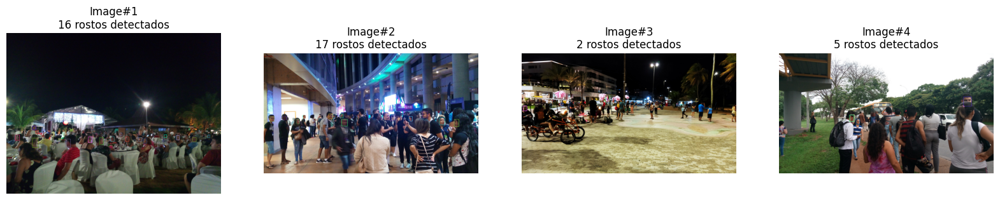

In [7]:
def inference_vis(res, n_ims, rows):
    cols = n_ims // rows
    plt.figure(figsize = (20, 10))
    for idx, r in enumerate(res):
        if idx == n_ims: break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        if idx == n_ims: break            
        for i in r:              
            for bbox in i.boxes:               
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
                cv2.rectangle(or_im_rgb, coord1, coord2, color=color, thickness=5)                
        plt.imshow(or_im_rgb)
        plt.axis("off"); plt.title(f"Image#{idx + 1}\n{len(r)} rostos detectados")        
        
inference_vis(res = results1, n_ims = 4, rows = 1)

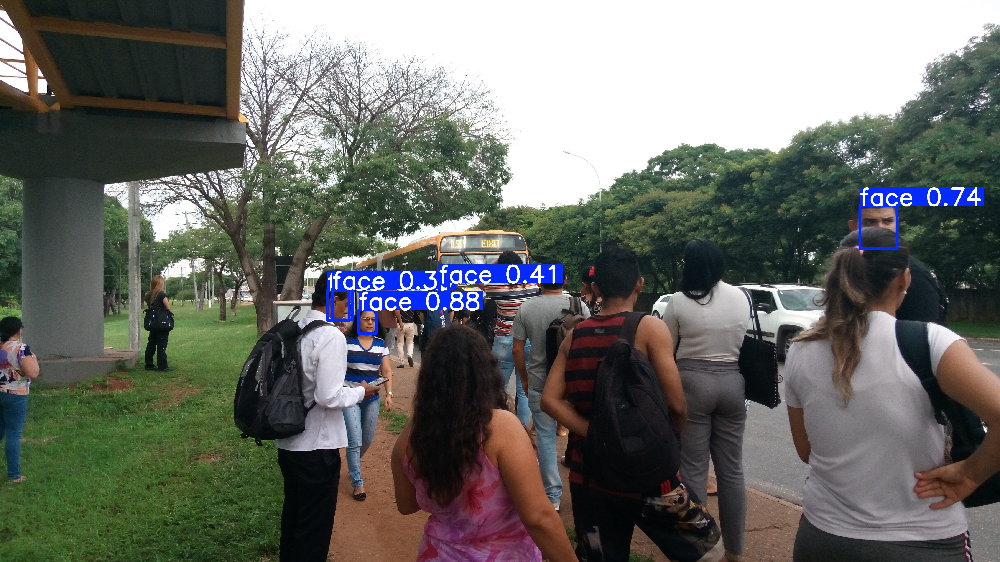

In [8]:
from IPython.display import Image, display

results2 = model("teste_face/teste4.jpg")
results2[0].plot()
imagemR = results2[0].save()
display(Image(filename=imagemR))